In [79]:
# Fáza 1 - prieskumná analýza
# Autori: Matej Delinčák (50%), Martin Pirkovský (50%)

In [80]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import scipy.stats as stats
import datetime
from scipy.stats import mannwhitneyu
from scipy.stats import levene
from scipy.stats import kruskal


#1. Základný opis dát spolu s ich charakteristikami (5 bodov)

In [81]:
# Načítame data zo súboru profiles.csv s oddelovačom tabulátor. Pretože dátumy mali rôzne formáty, všetky sme ich dali na jednotný pomocou parse_dates

filename = "001/profiles.csv"
df_profiles = pd.read_csv(filename, sep='\t', parse_dates=['birthdate'])
df_profiles.drop('Unnamed: 0', axis=1, inplace=True)
df_profiles.head()

,sex,blood_group,job,residence,birthdate,ssn,current_location,race,name
0,M,B-,Legal executive,"528 Allen Streets\r\nSolomonberg, NM 26158",1941-05-28,359-18-7254,"(Decimal('29.4768335'), Decimal('-42.485892'))",White,John Fletcher
1,F,B+,Oceanographer,360 Rebecca Islands Suite 046\r\nEast Yolandav...,1992-08-29,476-75-8468,"(Decimal('-80.467120'), Decimal('-106.725872'))",White,Alexis Benjamin
2,F,AB+,Academic librarian,"146 Ball Radial Suite 394\r\nEast Mark, AL 82880",1978-12-16,425-66-2119,"(Decimal('-54.963860'), Decimal('-43.530569'))",Indian,Heather Lee
3,F,AB+,"Editor, magazine features",67264 Patterson Plains Apt. 319\r\nKennethshir...,1921-04-07,869-12-0117,"(Decimal('-79.5156495'), Decimal('8.453819'))",Black,Laura Roman
4,F,O+,Secretary/administrator,"0975 Allen Manor\r\nSouth Davidville, NJ 88311",1998-12-07,296-87-0260,"(Decimal('49.395910'), Decimal('-15.478698'))",Asian,Miss Phyllis Oconnor


In [82]:
# Zobrazíme počet záznamov v datasete profiles
len(df_profiles)

3134

In [83]:
# Ukážeme ake majú typy atribúty v tabuľke
df_profiles.dtypes

sex                         object
blood_group                 object
job                         object
residence                   object
birthdate           datetime64[ns]
ssn                         object
current_location            object
race                        object
name                        object
dtype: object

In [84]:
# Zobrazíme počet atributov v datasete profiles
len(df_profiles.columns)

9

In [85]:
# Vyznamné atribúty a ich distribúcie
df_profiles.describe()

C:\Users\mpirk\AppData\Local\Temp/ipykernel_3340/2709991829.py:2: FutureWarning: Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.
  df_profiles.describe()


,sex,blood_group,job,residence,birthdate,ssn,current_location,race,name
count,3134,3134,3134,3134,3134,3134,3134,3134,3134
unique,2,8,634,3134,3016,3134,3134,8,3062
top,M,O-,Energy manager,"528 Allen Streets\r\nSolomonberg, NM 26158",1985-05-12 00:00:00,359-18-7254,"(Decimal('29.4768335'), Decimal('-42.485892'))",White,Jessica Garcia
freq,1589,426,14,1,3,1,1,1549,4
first,NaN,NaN,NaN,NaN,1905-10-10 00:00:00,NaN,NaN,NaN,NaN
last,NaN,NaN,NaN,NaN,2021-08-17 00:00:00,NaN,NaN,NaN,NaN


In [86]:
# Načítame data zo súboru labor.csv s oddelovačom tabulátor.
filename = "001/labor.csv"
df_labor = pd.read_csv(filename, sep='\t')
df_labor.drop('Unnamed: 0', axis=1, inplace=True)
df_labor.head()

,erytrocyty,trombocyty,weight,name,hbver,ssn,relationship,er-cv,smoker,indicator,hematokrit,leukocyty,alp,hemoglobin,ast,alt,etytr
0,5.75358,6.28829,72.99562,Ashley Mejia,7.83739,825-87-2350,separated,69.02328,N,0.0,6.68084,7.69536,76.74660,6.82079,61.73234,0.70514,4.81412
1,5.14673,7.42473,27.01891,Nicholas Cunningham,4.93689,180-95-1359,divoced,48.89584,N,1.0,6.67915,7.92839,17.17255,8.83229,78.07931,0.70497,5.96530
2,8.85321,6.19191,85.97257,Amy Pineda,7.81238,265-20-0465,nop,61.76278,no,0.0,8.37365,7.08646,9.29056,9.58719,74.48225,3.77250,7.79349
3,8.08038,6.66572,80.02693,Elizabeth Higgins,6.91584,075-09-7694,separated,44.51141,no,0.0,6.65188,8.49326,86.51256,5.78670,79.12359,2.39353,6.74682
4,8.91498,6.56509,119.48958,Andrew Ochoa,4.45796,850-79-7623,separated,42.06448,no,1.0,5.07778,5.72269,43.22939,7.71585,81.58218,4.34586,5.84598


In [87]:
# Zobrazíme počet záznamov v datasete labor
len(df_labor)

9965

In [88]:
# Ukážeme ake majú typy atribúty v datasete labor
df_labor.dtypes

erytrocyty      float64
trombocyty      float64
weight          float64
name             object
hbver           float64
ssn              object
relationship     object
er-cv           float64
smoker           object
indicator       float64
hematokrit      float64
leukocyty       float64
alp             float64
hemoglobin      float64
ast             float64
alt             float64
etytr           float64
dtype: object

In [89]:
# Zobrazíme počet atributov v datasete profiles
len(df_labor.columns)

17

In [90]:
# Vyznamné atribúty a ich distribúcie
df_labor.describe()

,erytrocyty,trombocyty,weight,hbver,er-cv,indicator,hematokrit,leukocyty,alp,hemoglobin,ast,alt,etytr
count,9934.000000,9933.000000,9965.000000,9934.000000,9935.000000,9965.000000,9935.000000,9935.000000,9935.000000,9934.000000,9934.000000,9935.000000,9935.000000
mean,6.797654,6.801356,69.848895,7.191444,54.908339,0.642047,6.824045,7.231332,68.678554,6.808648,73.539640,2.436029,6.804298
std,1.586898,1.003547,34.893262,1.726068,11.641219,0.479422,0.997373,1.649775,19.947629,1.007662,6.399017,4.409714,1.531073
min,2.538130,2.785270,-51.100280,1.511190,0.000000,0.000000,2.665920,0.000000,0.000000,2.561810,0.000000,0.000000,2.478170
25%,5.555995,6.127400,46.691580,5.924910,47.103720,0.000000,6.167460,6.350435,57.960030,6.120163,69.263925,0.922845,5.571580
50%,6.581820,6.821450,69.757770,7.245140,54.728850,1.000000,6.829680,7.539140,75.433870,6.810990,73.536730,1.244000,6.595960
75%,7.990825,7.477460,92.938000,8.391027,62.820825,1.000000,7.493555,8.371275,83.795710,7.496848,77.768900,2.269250,8.014680
max,12.235280,10.678970,200.452940,13.809250,100.000000,1.000000,10.643140,12.060330,100.000000,10.245150,100.000000,100.000000,13.764860


In [91]:
# Dva datasety spojíme na základe mena a použijeme full outer join, aby nám ostali všetky stĺpce

df_merged = pd.merge(df_profiles,df_labor,on='name',how='outer')
df_merged.head()

,sex,blood_group,job,residence,birthdate,ssn_x,current_location,race,name,erytrocyty,...,er-cv,smoker,indicator,hematokrit,leukocyty,alp,hemoglobin,ast,alt,etytr
0,M,B-,Legal executive,"528 Allen Streets\r\nSolomonberg, NM 26158",1941-05-28,359-18-7254,"(Decimal('29.4768335'), Decimal('-42.485892'))",White,John Fletcher,5.73089,...,54.28887,N,1.0,6.68658,8.13103,71.53264,5.51496,72.78350,1.40153,8.26858
1,M,B-,Legal executive,"528 Allen Streets\r\nSolomonberg, NM 26158",1941-05-28,359-18-7254,"(Decimal('29.4768335'), Decimal('-42.485892'))",White,John Fletcher,7.00210,...,47.56065,no,1.0,8.14919,7.95707,53.26854,7.70607,70.42034,1.08658,8.76562
2,M,B-,Legal executive,"528 Allen Streets\r\nSolomonberg, NM 26158",1941-05-28,359-18-7254,"(Decimal('29.4768335'), Decimal('-42.485892'))",White,John Fletcher,5.87203,...,53.69510,yes,1.0,8.61871,8.80296,71.23821,5.67911,63.46493,0.94280,7.87057
3,M,B-,Legal executive,"528 Allen Streets\r\nSolomonberg, NM 26158",1941-05-28,359-18-7254,"(Decimal('29.4768335'), Decimal('-42.485892'))",White,John Fletcher,8.87748,...,53.84332,Y,1.0,6.05747,7.70553,64.00914,5.27333,76.12388,4.43028,6.29355
4,F,B+,Oceanographer,360 Rebecca Islands Suite 046\r\nEast Yolandav...,1992-08-29,476-75-8468,"(Decimal('-80.467120'), Decimal('-106.725872'))",White,Alexis Benjamin,5.51507,...,36.38495,no,1.0,8.41361,8.02251,86.54993,6.48007,84.46566,1.39040,7.38177


In [92]:
# Zobrazíme počet záznamov v spojenom dataframe-e
len(df_merged)

10495

In [93]:
# Ukážeme ake majú typy atribúty v mergnutom datasete
df_merged.dtypes

sex                         object
blood_group                 object
job                         object
residence                   object
birthdate           datetime64[ns]
ssn_x                       object
current_location            object
race                        object
name                        object
erytrocyty                 float64
trombocyty                 float64
weight                     float64
hbver                      float64
ssn_y                       object
relationship                object
er-cv                      float64
smoker                      object
indicator                  float64
hematokrit                 float64
leukocyty                  float64
alp                        float64
hemoglobin                 float64
ast                        float64
alt                        float64
etytr                      float64
dtype: object

In [94]:
# Zobrazíme počet atribútov v spojenom dataframe-e
len(df_merged.columns)

25

In [95]:
# Zobrazíme významné atributy a ich distribucie v spojenom dataframe-e
df_merged.describe()

,erytrocyty,trombocyty,weight,hbver,er-cv,indicator,hematokrit,leukocyty,alp,hemoglobin,ast,alt,etytr
count,10464.000000,10462.000000,10495.000000,10464.000000,10464.000000,10495.000000,10465.000000,10464.000000,10465.000000,10462.000000,10462.000000,10463.000000,10463.000000
mean,6.797553,6.800557,70.036078,7.189203,54.895975,0.642211,6.824631,7.227896,68.704426,6.807972,73.526168,2.428059,6.805558
std,1.584803,1.005890,34.875698,1.732465,11.638543,0.479373,0.997630,1.648886,19.911391,1.006951,6.420153,4.364798,1.533215
min,2.538130,2.785270,-51.100280,1.511190,0.000000,0.000000,2.665920,0.000000,0.000000,2.561810,0.000000,0.000000,2.478170
25%,5.559750,6.124598,46.770755,5.906990,47.064177,0.000000,6.166980,6.346930,58.057720,6.120150,69.238322,0.924240,5.570295
50%,6.582500,6.822390,69.897610,7.248590,54.761415,1.000000,6.831870,7.536260,75.461340,6.808200,73.521405,1.244000,6.606850
75%,7.985615,7.478460,93.122510,8.398238,62.805138,1.000000,7.495720,8.365932,83.817770,7.493805,77.759380,2.267315,8.017560
max,12.235280,10.678970,200.452940,13.809250,100.000000,1.000000,10.643140,12.060330,100.000000,10.245150,100.000000,100.000000,13.764860


# 4. Identifikácia problémov v dátach s navrhnuným riešením v ďalšej fáze (3 body)

In [96]:
# Zobrazíme počet "null" hodnôt v spojenom dataframe-e
df_merged.isnull().sum()

sex                  0
blood_group          0
job                  0
residence            0
birthdate            0
ssn_x                0
current_location     0
race                 0
name                 0
erytrocyty          31
trombocyty          33
weight               0
hbver               31
ssn_y                0
relationship         0
er-cv               31
smoker               0
indicator            0
hematokrit          30
leukocyty           31
alp                 30
hemoglobin          33
ast                 33
alt                 32
etytr               32
dtype: int64

In [97]:
# A následne vymazanie riadkov s "null" hodnotami -> take predsa nechceme :)
df_merged.dropna(subset = ["erytrocyty", "trombocyty", "hbver", "er-cv", "hematokrit", "leukocyty", "alp", "hemoglobin", "ast", "alt", "etytr"], inplace=True)

In [98]:
# Vymazanie duplikátov v dataframe-e
df_merged.drop_duplicates

<bound method DataFrame.drop_duplicates of       sex blood_group                            job  \
0       M          B-                Legal executive   
1       M          B-                Legal executive   
2       M          B-                Legal executive   
3       M          B-                Legal executive   
4       F          B+                  Oceanographer   
...    ..         ...                            ...   
10490   M          O-     Designer, interior/spatial   
10491   M          O-     Designer, interior/spatial   
10492   F          O+  Telecommunications researcher   
10493   F          O+  Telecommunications researcher   
10494   F          O+  Telecommunications researcher   

                                               residence  birthdate  \
0             528 Allen Streets\r\nSolomonberg, NM 26158 1941-05-28   
1             528 Allen Streets\r\nSolomonberg, NM 26158 1941-05-28   
2             528 Allen Streets\r\nSolomonberg, NM 26158 1941-05-28   


In [99]:
# Funkcia identify_outliers slúži na identifikovanie outlierov vrámci jedného stĺpca dataframe-u
def identify_outliers(a):
    lower = a.quantile(0.25) - 1.5 * stats.iqr(a)
    upper = a.quantile(0.75) + 1.5 * stats.iqr(a)

    return a[(a > upper) | (a < lower)]

# v numerics vytiahneme z dataframe-u len stlpce, ktoré majú číselné hodnoty
numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
newdf = df_merged.select_dtypes(include=numerics)

# a pre každý stĺpec identifikujeme outlierov, ktorých nasledne vymazeme
for column in newdf.columns:
    df_merged_out = identify_outliers(df_merged[column])
    df_merged = df_merged.drop(df_merged_out.index)

In [100]:
# Nahradenie hodnôt, ktoré mali zle údaje a v stĺpci smoker no za 0, a yes za 1 => aby sme mohli vyuzit číselné hodnoty
# Pridaný stĺpec "age"
df_merged.replace('no', 0, inplace=True)
df_merged.replace('yes', 1, inplace=True)
df_merged.replace('N', 0, inplace=True)
df_merged.replace('Y', 1, inplace=True)
df_merged.replace('divoced', 'divorced', inplace=True)
df_merged.replace('black', 'Black', inplace=True)
df_merged.replace('blsck', 'Black', inplace=True)
df_merged.replace('white', 'White', inplace=True)
df_merged["age"] = datetime.datetime.now().year - pd.DatetimeIndex(df_merged["birthdate"]).year
df_merged.head()

,sex,blood_group,job,residence,birthdate,ssn_x,current_location,race,name,erytrocyty,...,smoker,indicator,hematokrit,leukocyty,alp,hemoglobin,ast,alt,etytr,age
0,M,B-,Legal executive,"528 Allen Streets\r\nSolomonberg, NM 26158",1941-05-28,359-18-7254,"(Decimal('29.4768335'), Decimal('-42.485892'))",White,John Fletcher,5.73089,...,0,1.0,6.68658,8.13103,71.53264,5.51496,72.78350,1.40153,8.26858,80
1,M,B-,Legal executive,"528 Allen Streets\r\nSolomonberg, NM 26158",1941-05-28,359-18-7254,"(Decimal('29.4768335'), Decimal('-42.485892'))",White,John Fletcher,7.00210,...,0,1.0,8.14919,7.95707,53.26854,7.70607,70.42034,1.08658,8.76562,80
2,M,B-,Legal executive,"528 Allen Streets\r\nSolomonberg, NM 26158",1941-05-28,359-18-7254,"(Decimal('29.4768335'), Decimal('-42.485892'))",White,John Fletcher,5.87203,...,1,1.0,8.61871,8.80296,71.23821,5.67911,63.46493,0.94280,7.87057,80
4,F,B+,Oceanographer,360 Rebecca Islands Suite 046\r\nEast Yolandav...,1992-08-29,476-75-8468,"(Decimal('-80.467120'), Decimal('-106.725872'))",White,Alexis Benjamin,5.51507,...,0,1.0,8.41361,8.02251,86.54993,6.48007,84.46566,1.39040,7.38177,29
5,F,B+,Oceanographer,360 Rebecca Islands Suite 046\r\nEast Yolandav...,1992-08-29,476-75-8468,"(Decimal('-80.467120'), Decimal('-106.725872'))",White,Alexis Benjamin,5.85015,...,0,1.0,5.83565,4.09952,78.19334,5.81326,58.70294,0.87188,4.82141,29


# 2. Párová analýza dát (5 bodov)

C:\Users\mpirk\AppData\Local\Temp/ipykernel_3340/54536120.py:4: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  df_merged.hist(ax = ax)


array([[<AxesSubplot:title={'center':'birthdate'}>,
        <AxesSubplot:title={'center':'erytrocyty'}>,
        <AxesSubplot:title={'center':'trombocyty'}>,
        <AxesSubplot:title={'center':'weight'}>],
       [<AxesSubplot:title={'center':'hbver'}>,
        <AxesSubplot:title={'center':'er-cv'}>,
        <AxesSubplot:title={'center':'smoker'}>,
        <AxesSubplot:title={'center':'indicator'}>],
       [<AxesSubplot:title={'center':'hematokrit'}>,
        <AxesSubplot:title={'center':'leukocyty'}>,
        <AxesSubplot:title={'center':'alp'}>,
        <AxesSubplot:title={'center':'hemoglobin'}>],
       [<AxesSubplot:title={'center':'ast'}>,
        <AxesSubplot:title={'center':'alt'}>,
        <AxesSubplot:title={'center':'etytr'}>,
        <AxesSubplot:title={'center':'age'}>]], dtype=object)

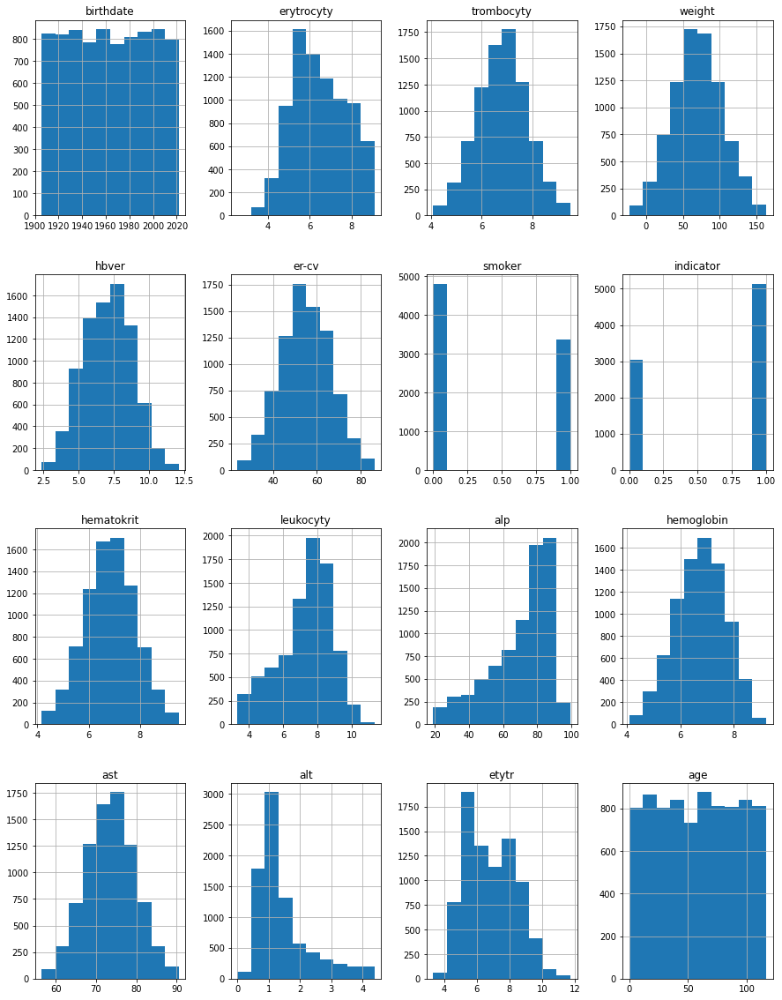

In [101]:
# Zobrazíme si histogram hodnôt až si vieme odhadnúť o aké rozdelenie ide
fig = plt.figure(figsize = (15,20))
ax = fig.gca()
df_merged.hist(ax = ax)

<AxesSubplot:>

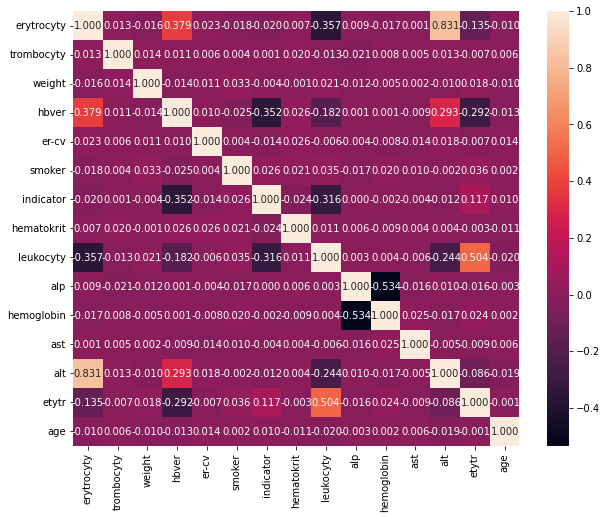

In [102]:
# V tejto tabuľke je vidieť korelácie medzi všetkými vlastnosťami. Najväčšia závislosť je medzi stľpcom electrocyty a alt.
# Ale závislosť pri indicatore aspoň nejaká vyzerá byť pre vlastnosti leukocytov a hbver
# Túto informáciu ďalej použijeme pri hypotézach

fig, ax = plt.subplots(figsize=(10,8))
sns.heatmap(df_merged.corr(), ax=ax, annot=True, fmt=".3f")

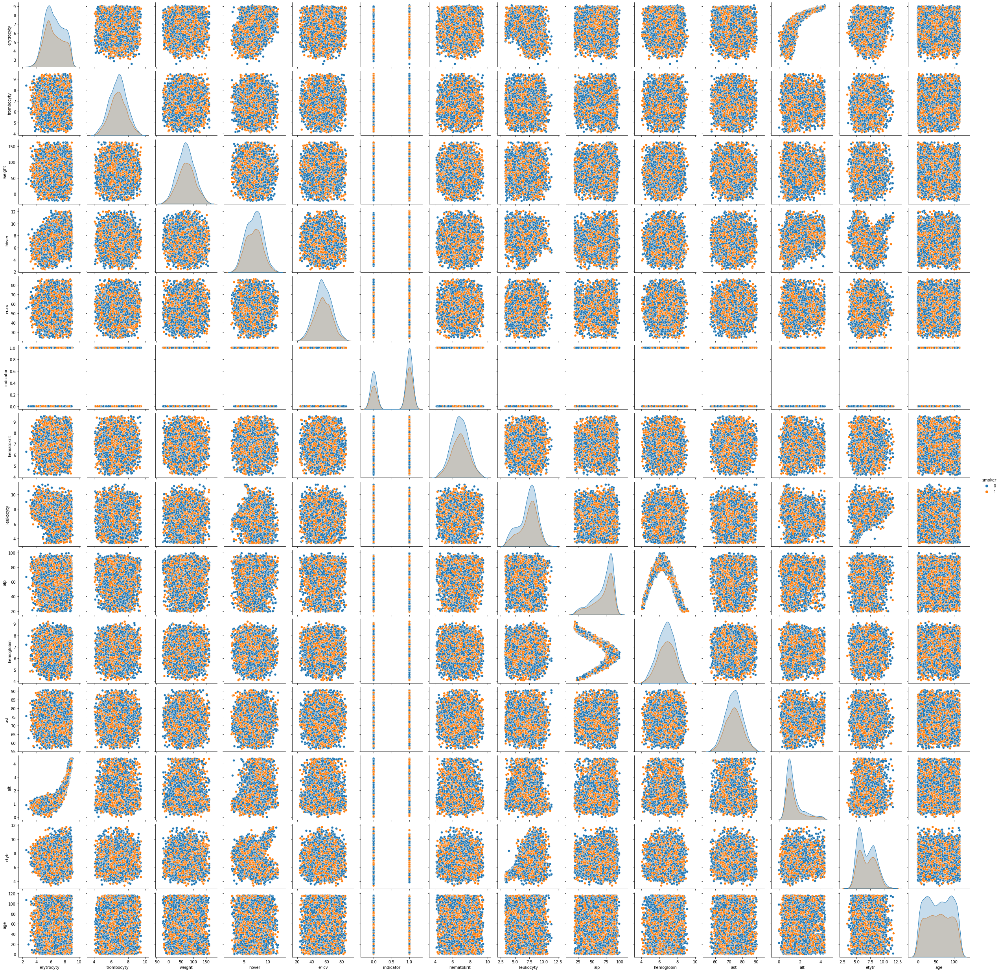

In [103]:
sns.pairplot(df_merged, hue="smoker")

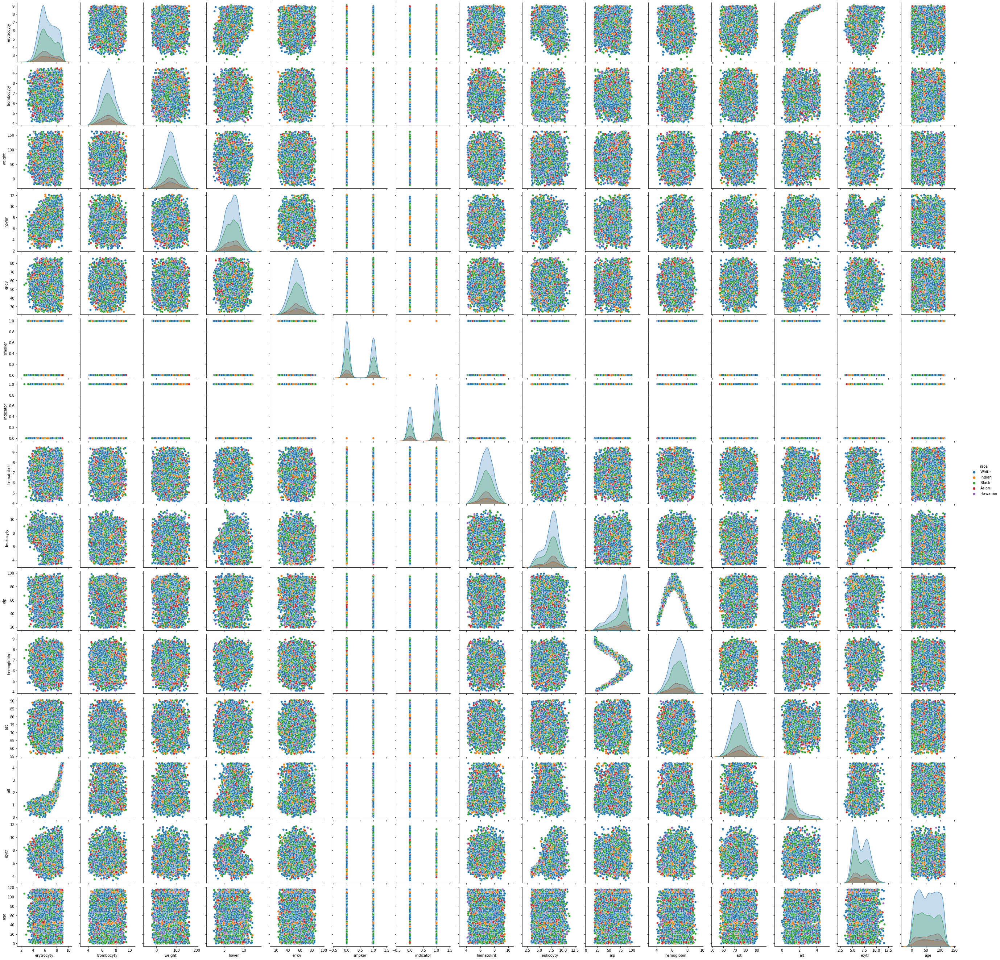

In [104]:
sns.pairplot(df_merged, hue="race")

<AxesSubplot:xlabel='indicator', ylabel='leukocyty'>

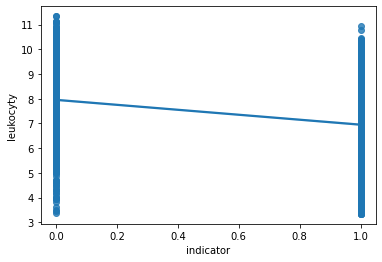

In [105]:
# Možno bude nejaká závislosť, skúsime overiť neskôr

sns.regplot(x="indicator", y="leukocyty", data=df_merged)

<AxesSubplot:xlabel='indicator', ylabel='hbver'>

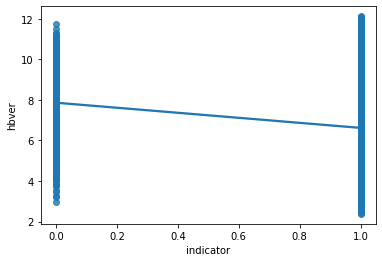

In [106]:
# Možno bude nejaká závislosť, skúsime overiť neskôr

sns.regplot(x="indicator", y="hbver", data=df_merged)

# 3. Formulácia a štatistické overenie hypotéz o dátach (2 body)

Hypoteza 1:

H<sub>0</sub> → Čím väčšia hodnota leukocytov, tým je väčšia šanca, že pacient pôjde znova na vyšetrenie

H<sub>1</sub> → H<sub>0</sub> zamietame

Statistics=10480494.500, p=0.000
Different distribution (reject H0)


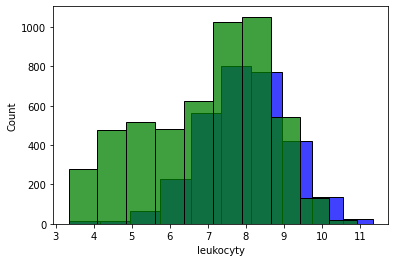

In [107]:
# Mann-Whitney U-test

leukocytyZeroIndicator = (df_merged.loc[df_merged["indicator"] == 0])["leukocyty"]
leukocytyOneIndicator = (df_merged.loc[df_merged["indicator"] == 1])["leukocyty"]

sns.histplot(leukocytyZeroIndicator, bins=10, color="blue")
sns.histplot(leukocytyOneIndicator, bins=10, color="green")

stat, p = mannwhitneyu(leukocytyZeroIndicator, leukocytyOneIndicator)
print('Statistics=%.3f, p=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Same distribution (fail to reject H0)')
else:
    print('Different distribution (reject H0)')

In [108]:
# Levene test

a = leukocytyZeroIndicator
b = leukocytyOneIndicator
[np.var(x, ddof=1) for x in [a, b]]

levene_test = levene(a, b)
print(levene_test)

alpha = 0.05
if levene_test.pvalue > alpha:
    print('Equal variances (fail to reject H0)')
else:
    print('Another variances (reject H0)')


# Použili sme Mann-Whitney U-test (testovali sme či sa jedná o rovnaké rozdelenie)
# a Levene test (testovali sme či majú rovnaké distribúcie) a v oboch nám vyšlo, že H0 zamietame a teda tieto dve hodnoty spolu nesúvisia

LeveneResult(statistic=450.16676211322516, pvalue=2.689543136563104e-97)
Another variances (reject H0)


Hypoteza 2:

H<sub>0</sub> → Počet nosičov vírusu hepatitidy typu B súvisí s tým, či človek je chorobnejší.

H<sub>1</sub> → H<sub>0</sub> zamietame

Statistics=1181.725, p=0.000
Different distributions (reject H0)


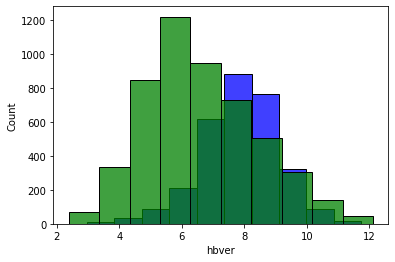

In [109]:
# Kruskal-Wallis H Test

hbverZeroIndicator = (df_merged.loc[df_merged["indicator"] == 0])["hbver"]
hbverOneIndicator = (df_merged.loc[df_merged["indicator"] == 1])["hbver"]

sns.histplot(hbverZeroIndicator, bins=10, color="blue")
sns.histplot(hbverOneIndicator, bins=10, color="green")

stat, p = kruskal(hbverZeroIndicator, hbverOneIndicator)
print('Statistics=%.3f, p=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Same distributions (fail to reject H0)')
else:
    print('Different distributions (reject H0)')

In [110]:
# Levene test

a = hbverZeroIndicator
b = hbverOneIndicator
[np.var(x, ddof=1) for x in [a, b]]

levene_test = levene(a, b)
print(levene_test)

alpha = 0.05
if levene_test.pvalue > alpha:
    print('Equal variances (fail to reject H0)')
else:
    print('Another variances (reject H0)')

# Použili sme Kruskalov test (testovali sme či sa jedná o rovnaké rozdelenie - je robustnejsi)
# a Levene test a v oboch nám vyšlo, že H0 zamietame a teda tieto dve hodnoty spolu nesúvisia

LeveneResult(statistic=462.82858690429634, pvalue=6.605642183099556e-100)
Another variances (reject H0)


Hypoteza 3:

H<sub>0</sub> → Vyššia hodnota etytr u človeka, súvisí so zdravotným stavom človeka.

H<sub>1</sub> → H<sub>0</sub> zamietame

Statistics=6606603.500, p=0.000
Different distributions (reject H0)


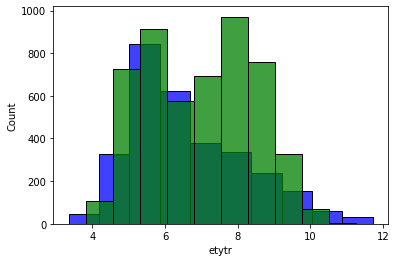

In [111]:
# Mann-Whitney U-test

etytrZeroIndicator = (df_merged.loc[df_merged["indicator"] == 0])["etytr"]
etytrOneIndicator = (df_merged.loc[df_merged["indicator"] == 1])["etytr"]

sns.histplot(etytrZeroIndicator, bins=10, color="blue")
sns.histplot(etytrOneIndicator, bins=10, color="green")

stat, p = mannwhitneyu(etytrZeroIndicator, etytrOneIndicator)
print('Statistics=%.3f, p=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Same distributions (fail to reject H0)')
else:
    print('Different distributions (reject H0)')

In [112]:
# Levene test

a = etytrZeroIndicator
b = etytrOneIndicator
[np.var(x, ddof=1) for x in [a, b]]

levene_test = levene(a, b)
print(levene_test)

alpha = 0.05
if levene_test.pvalue > alpha:
    print('Equal variances (fail to reject H0)')
else:
    print('Another variances (reject H0)')

# Použili sme Mann-Whitney U-test (testovali sme či sa jedná o rovnaké rozdelenie)
# a Levene test (testovali sme či majú rovnaké distribúcie) a pri levenovom teste nam vyslo, ze H0 nezamietame

LeveneResult(statistic=1.5073263929279253, pvalue=0.21958285375825629)
Equal variances (fail to reject H0)
